# Task 1 - Distribution of genes among the different clusters - combined
This notebook analyses the distribution of individual genes among the different clusters.

This notebook is based on the single-cell tutorial (https://github.com/theislab/single-cell-tutorial). For further explanations of the applied methods please refer to above source.

In [1]:
import scanpy as sc
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
import os
from os import listdir
from os.path import isfile, join
import logging

In [2]:
plt.rcParams['figure.figsize']=(8,8) #rescale figures
sc.settings.verbosity = 3

### Load adata

In [3]:
adata1 = sc.read_h5ad('../data/adata/rev_processed_adata1.h5ad')
adata1.obsm.clear()
adata2 = sc.read_h5ad('../data/adata/rev_processed_adata2.h5ad')
adata2.obsm.clear()
adata3 = sc.read_h5ad('../data/adata/rev_processed_adata3.h5ad')
adata3.obsm.clear()
adata4 = sc.read_h5ad('../data/adata/rev_processed_adata4.h5ad')
adata4.obsm.clear()
adata5 = sc.read_h5ad('../data/adata/rev_processed_adata5.h5ad')
adata5.obsm.clear()
adata6 = sc.read_h5ad('../data/adata/rev_processed_adata6.h5ad')
adata6.obsm.clear()
adata7 = sc.read_h5ad('../data/adata/rev_processed_adata7.h5ad')
adata7.obsm.clear()

import anndata as ad

adata = ad.concat([adata1, adata2, adata3, adata4, adata5, adata6, adata7])

In [4]:
adata.var

""
ENSMUSG00000051285
ENSMUSG00000039748
ENSMUSG00000057363
ENSMUSG00000038702
ENSMUSG00000033021
...
ENSMUSG00000064367
ENSMUSG00000064368
ENSMUSG00000064370
ENSMUSG00000095041


<a id="Clustering"></a>

## Clustering

In [5]:
sc.pp.highly_variable_genes(adata, flavor='cell_ranger', n_top_genes=4000)


If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:04)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


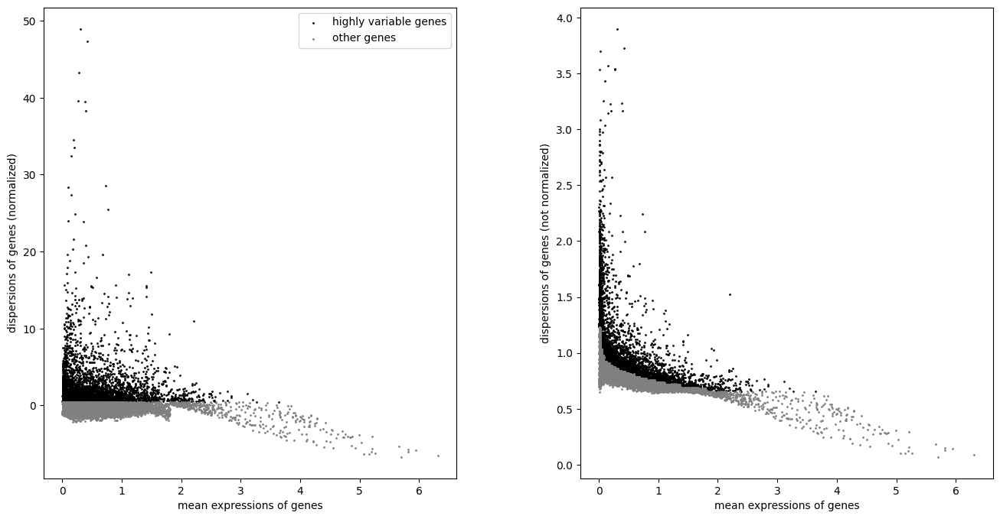

In [6]:
sc.pl.highly_variable_genes(adata1)

In [7]:
# Calculate the visualizations
sc.pp.pca(adata, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata)

sc.tl.tsne(adata, n_jobs=12) #Note n_jobs works for MulticoreTSNE, but not regular implementation)
sc.tl.umap(adata)
sc.tl.diffmap(adata)
sc.tl.draw_graph(adata)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:38)
computing neighbors
    using 'X_pca' with n_pcs = 50


/Users/till.richter/anaconda3/envs/celldreamer/lib/python3.11/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/till.richter/anaconda3/envs/celldreamer/lib/python3.11/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/till.richter/anaconda3/envs/celldreamer

    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:11)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE


/Users/till.richter/anaconda3/envs/celldreamer/lib/python3.11/site-packages/scanpy/tools/_tsne.py:105: UserWarning: In previous versions of scanpy, calling tsne with n_jobs > 1 would use MulticoreTSNE. Now this uses the scikit-learn version of TSNE by default. If you'd like the old behaviour (which is deprecated), pass 'use_fast_tsne=True'. Note, MulticoreTSNE is not actually faster anymore.
  warnings.warn(


    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:01:51)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:24)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9999618  0.99923545 0.99909425 0.99900633 0.99876124
     0.99778223 0.9910204  0.9906974  0.9890958  0.9871477  0.9866156
     0.98238486 0.9793339  0.97633475]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:02)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fr', graph_drawing coordinates (adata.obsm) (0:34:28)


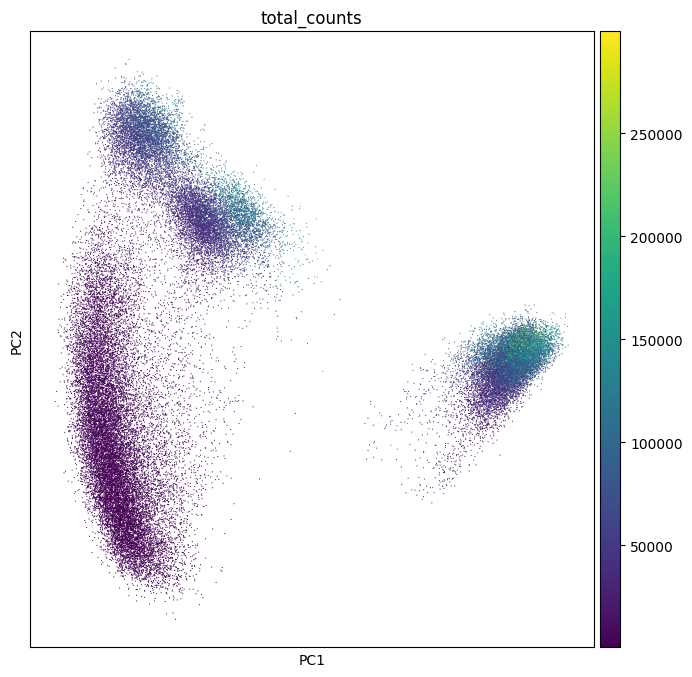

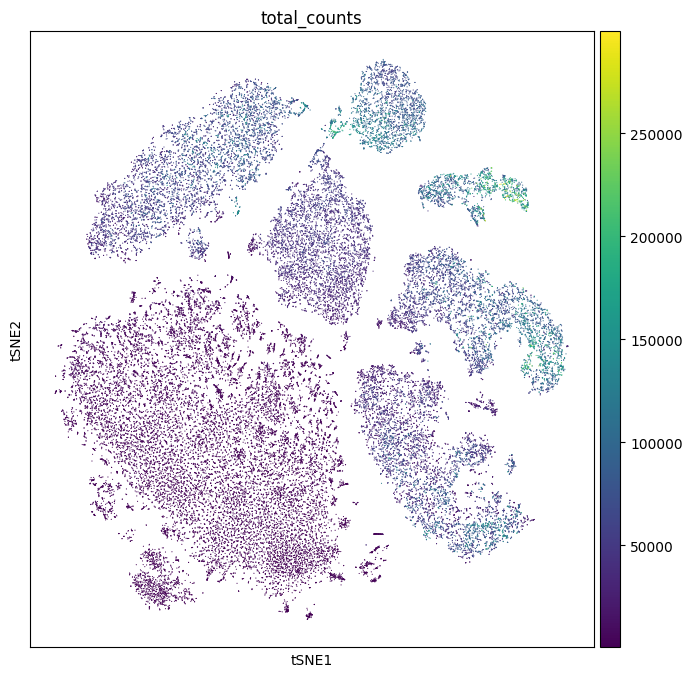

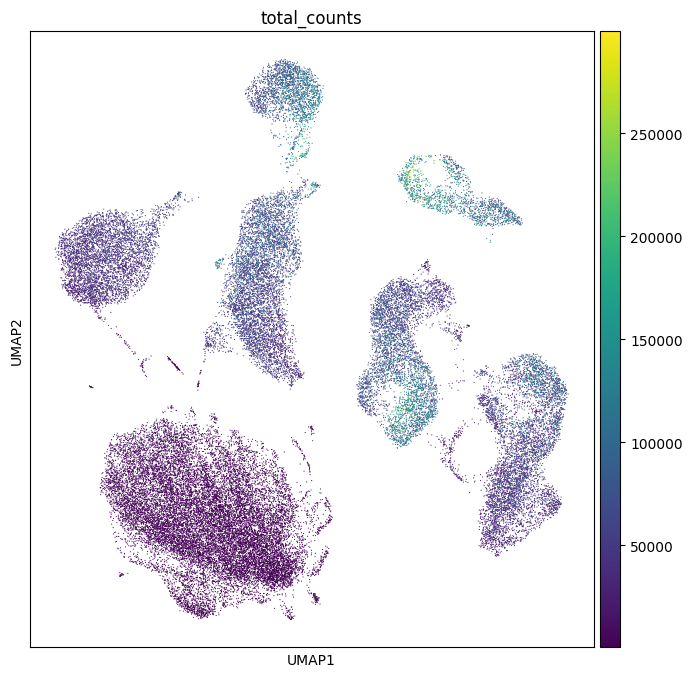

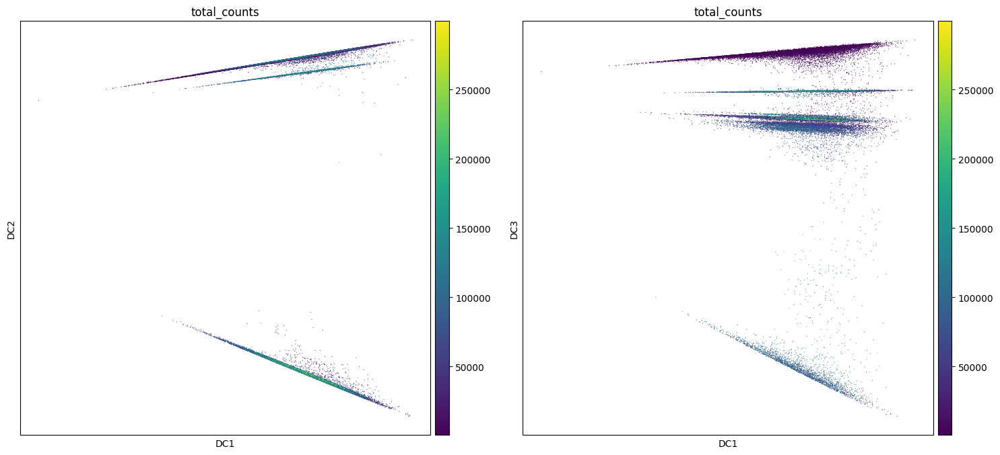

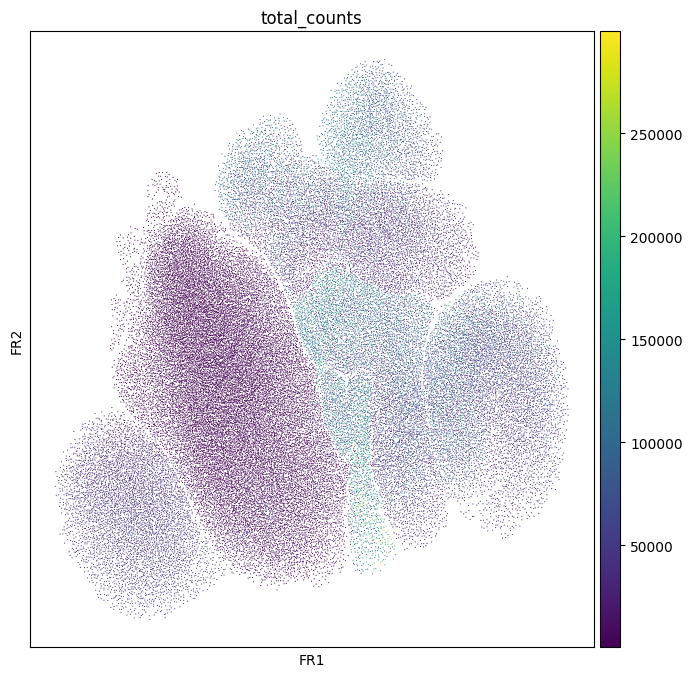

In [8]:
sc.pl.pca_scatter(adata, color='total_counts', save='pca_combined.pdf')
sc.pl.tsne(adata, color='total_counts', save='tsne_combined.pdf')
sc.pl.umap(adata, color='total_counts', save='umap_combined.pdf')
sc.pl.diffmap(adata, color='total_counts', components=['1,2','1,3'], save='diffmap_combined.pdf')
sc.pl.draw_graph(adata, color='total_counts', save='draw_graph_combined.pdf')

In [9]:
# Perform clustering - using highly variable genes
# sc.tl.louvain(adata, key_added='louvain_r1')
sc.tl.louvain(adata, resolution=0.05, key_added='louvain_r0.05', random_state=10)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 7 clusters and added
    'louvain_r0.05', the cluster labels (adata.obs, categorical) (0:00:07)


In [10]:
adata.obs['louvain_r0.05'].value_counts()

louvain_r0.05
0    20434
1     6391
2     6295
3     5090
4     4877
5     2332
6     1548
Name: count, dtype: int64

In [12]:
adata.obs

,sample_id,sample_nr,donor,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,log_counts,n_counts,n_genes,size_factors,louvain_r0.05
AAACCCAAGCGTCTGC-1-0-0-0-0-0-0,1_9591_TEBBO,0,mouse,6425,8.768108,33471.0,10.418465,21.947357,30.028980,39.547668,53.033970,0.0,0.0,0.0,10.418435,33471.0,6425,0.901822,4
AAACCCACAGCAGTTT-1-0-0-0-0-0-0,1_9591_TEBBO,0,mouse,7388,8.907748,53954.0,10.895905,20.773251,30.629796,40.371428,53.454795,0.0,0.0,0.0,10.895887,53954.0,7388,1.462143,4
AAACCCACAGGTCAAG-1-0-0-0-0-0-0,1_9591_TEBBO,0,mouse,6240,8.738896,32445.0,10.387333,21.732162,31.502543,40.915395,53.752504,0.0,0.0,0.0,10.387301,32445.0,6240,0.877331,4
AAACCCACATTCCTAT-1-0-0-0-0-0-0,1_9591_TEBBO,0,mouse,1079,6.984716,1787.0,7.488853,25.853386,34.750979,46.838276,67.599328,0.0,0.0,0.0,7.488294,1787.0,1079,0.038582,0
AAACCCATCGAAGGAC-1-0-0-0-0-0-0,1_9591_TEBBO,0,mouse,6506,8.780634,36774.0,10.512573,23.851090,33.700441,43.345842,55.824767,0.0,0.0,0.0,10.512547,36774.0,6506,0.924524,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGCAGCACAGA-1-1,7_star-like,1,mouse,7535,8.927447,64538.0,11.075025,21.889429,31.998203,41.972171,55.313149,0.0,0.0,0.0,11.075009,64538.0,7535,1.682680,3
TTTGTTGGTACATTGC-1-1,7_star-like,1,mouse,3629,8.196988,8385.0,9.034319,12.784735,18.366130,26.440072,42.742993,0.0,0.0,0.0,9.034200,8385.0,3629,0.392576,3
TTTGTTGGTAGTATAG-1-1,7_star-like,1,mouse,7480,8.920122,55482.0,10.923832,21.452002,32.394290,42.502073,54.974586,0.0,0.0,0.0,10.923814,55482.0,7480,1.462513,3
TTTGTTGGTTGTGGCC-1-1,7_star-like,1,mouse,7885,8.972844,63675.0,11.061563,17.502945,25.980369,35.586965,49.804476,0.0,0.0,0.0,11.061547,63675.0,7885,1.841218,3


/Users/till.richter/anaconda3/envs/celldreamer/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


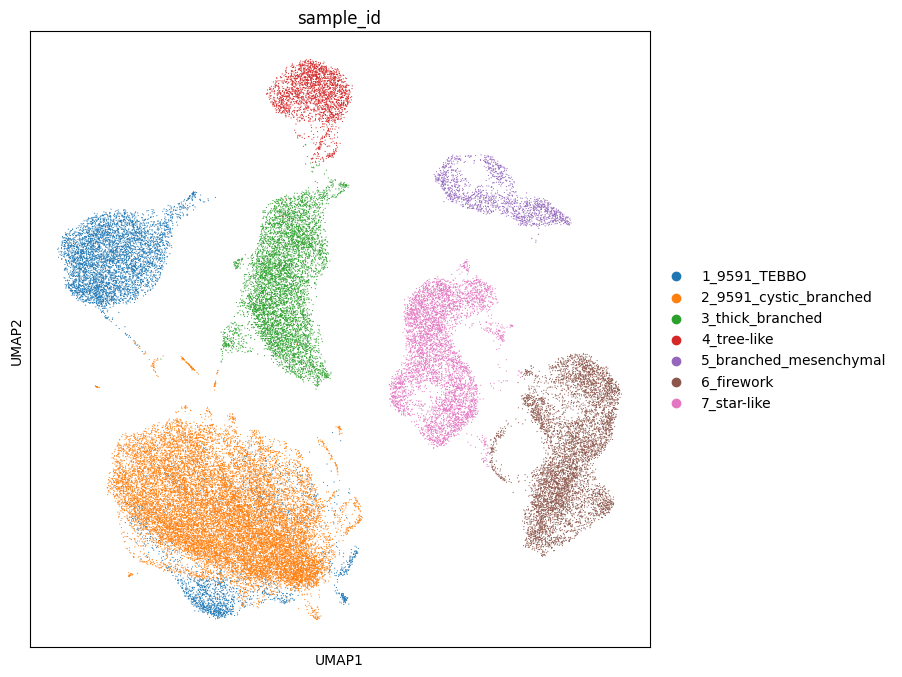

In [13]:
sc.pl.umap(adata, color=['sample_id'])


/Users/till.richter/anaconda3/envs/celldreamer/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


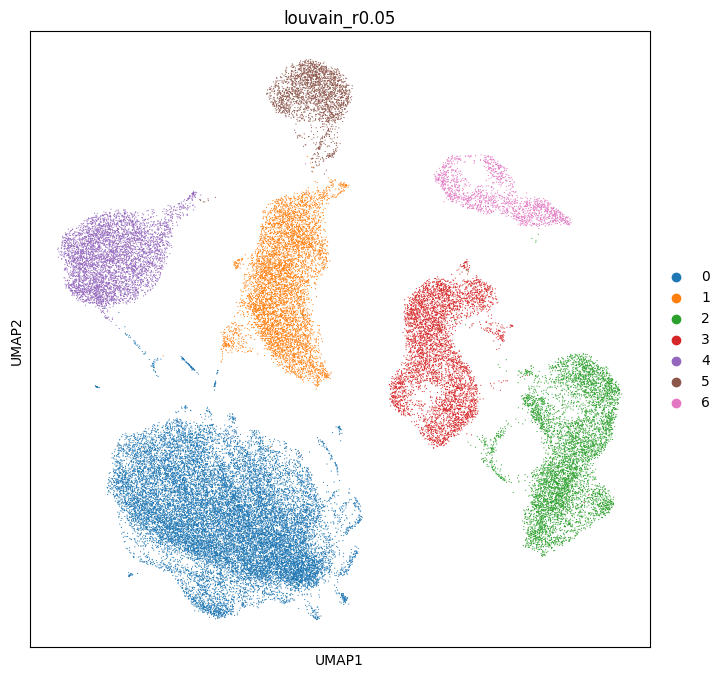

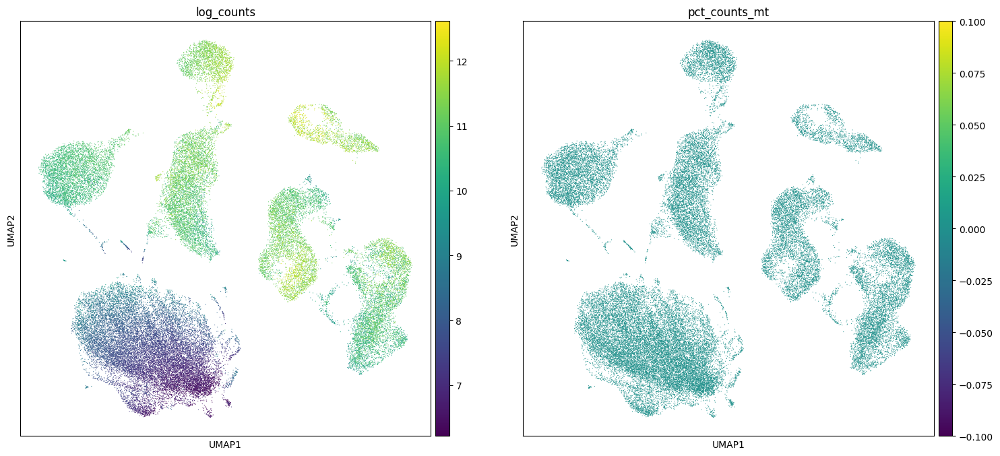

In [14]:
# Analysis sees 3 classes here
# Visualize the clustering and how this is reflected by different technical covariates
sc.pl.umap(adata, color=['louvain_r0.05'], save='umap_combined.pdf')

sc.pl.umap(adata, color=['log_counts', 'pct_counts_mt'], save='umap_counts_combined.pdf')

<a id="Markers"></a>

## Marker genes & cluster annotation

In [15]:
# Perform gene ranking on the modified AnnData object
sc.tl.rank_genes_groups(adata, groupby='louvain_r0.05', key_added='rank_genes_r0.05')



ranking genes
    finished: added to `.uns['rank_genes_r0.05']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:18)


In [16]:
gene_symbols0 = ['ENSMUSG00000029635', 'ENSMUSG00000022748', 'ENSMUSG00000028255', 'ENSMUSG00000035202', 'ENSMUSG00000074183']
gene_symbols1 = ['ENSMUSG00000029153', 'ENSMUSG00000030688', 'ENSMUSG00000032278', 'ENSMUSG00000017607']
gene_symbols2 = ['ENSMUSG00000001020', 'ENSMUSG00000064080', 'ENSMUSG00000029761', 'ENSMUSG00000026193']
gene_symbols3 = ['ENSMUSG00000026193', 'ENSMUSG00000068220', 'ENSMUSG00000001020', 'ENSMUSG00000029761', 'ENSMUSG00000022306']
gene_symbols4 = ['ENSMUSG00000041261', 'ENSMUSG00000027006', 'ENSMUSG00000055114', 'ENSMUSG00000058624']
gene_symbols5 = ['ENSMUSG00000074129', 'ENSMUSG00000052942', 'ENSMUSG00000045991', 'ENSMUSG00000008682', 'ENSMUSG00000058558']
gene_symbols6 = ['ENSMUSG00000029761', 'ENSMUSG00000040466', 'ENSMUSG00000005397', 'ENSMUSG00000021477', 'ENSMUSG00000001020', 'ENSMUSG00000026728']

In [30]:
adata.var

,highly_variable,means,dispersions,dispersions_norm
ENSMUSG00000051285,False,0.983918,0.902578,-0.518510
ENSMUSG00000039748,False,0.068404,0.864997,-0.349275
ENSMUSG00000057363,False,0.575489,0.914438,-0.308049
ENSMUSG00000038702,False,0.178265,0.841523,-0.526244
ENSMUSG00000033021,False,0.318111,0.905167,-0.189125
...,...,...,...,...
ENSMUSG00000064367,False,2.875610,0.645551,-0.920911
ENSMUSG00000064368,True,0.981463,1.136256,2.750222
ENSMUSG00000064370,False,4.579202,0.407653,-2.481649
ENSMUSG00000095041,False,1.609648,0.890528,-0.237647


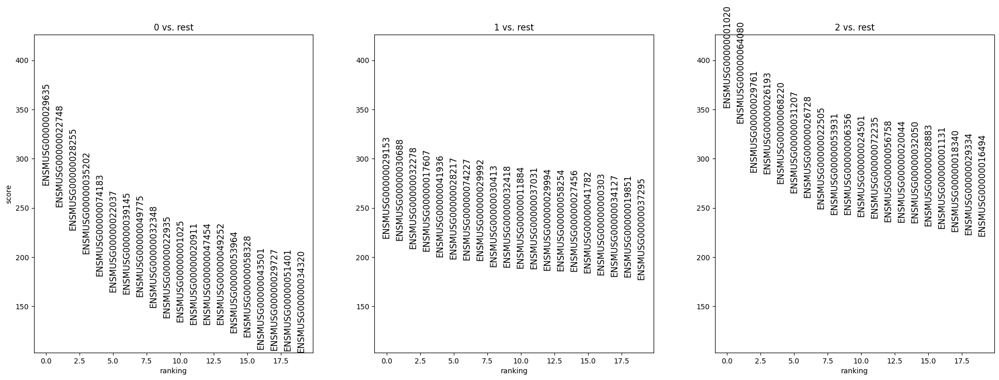

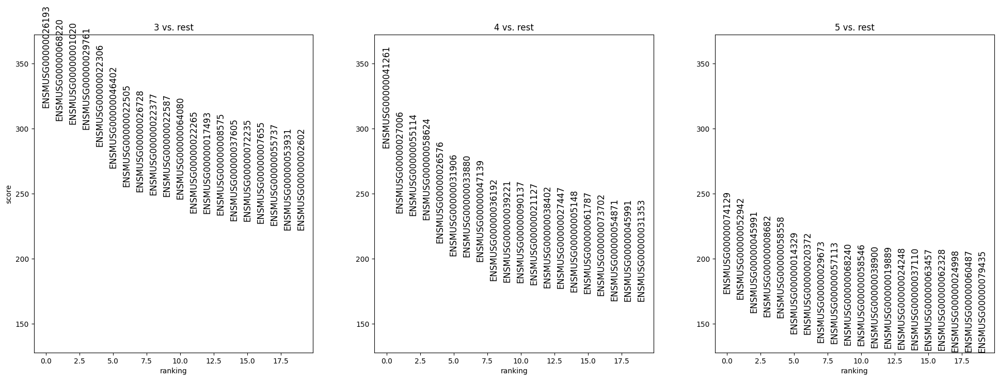

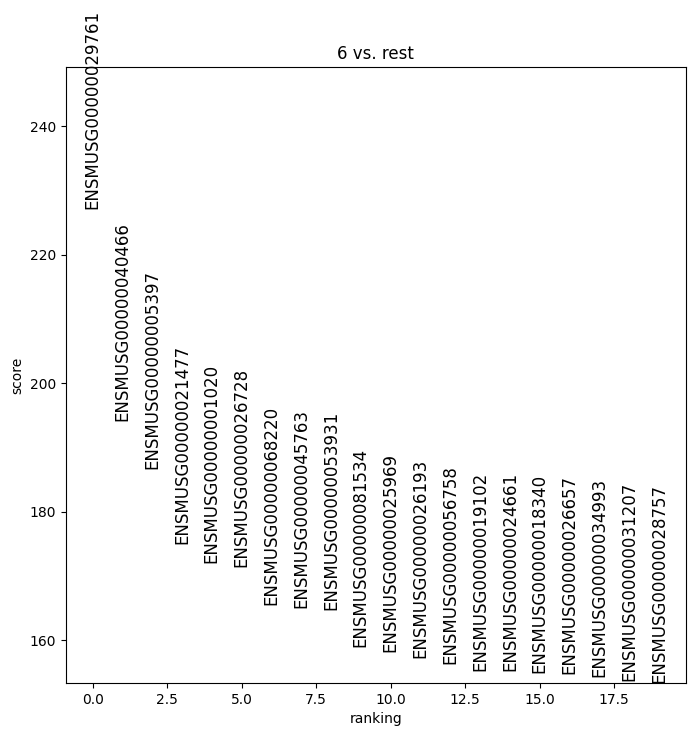

In [17]:
# Visualize the results using gene symbols
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.05', groups=['0', '1', '2'], fontsize=12)
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.05', groups=['3', '4', '5'], fontsize=12)
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.05', groups=['6'], fontsize=12)

In [18]:
# Define a nice colour map for gene expression
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

Below we plot genes of particular interest within the clusters

### Cluster 0

Encrypted symbol for  ENSMUSG00000029635 is  Cdk8


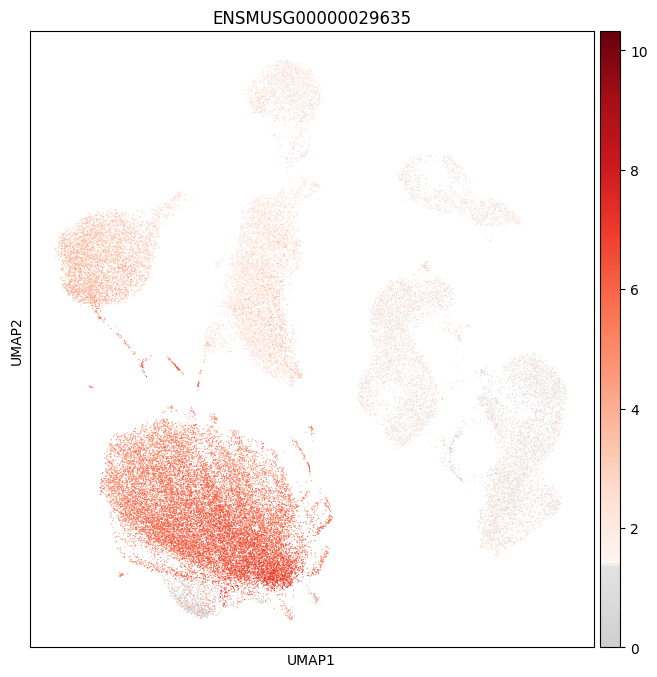

Encrypted symbol for  ENSMUSG00000022748 is  Cmss1


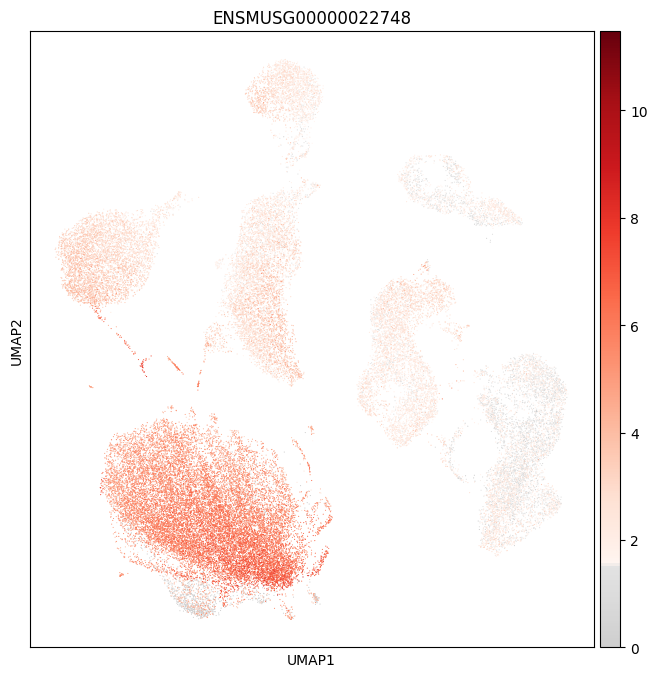

Encrypted symbol for  ENSMUSG00000028255 is  Clca1


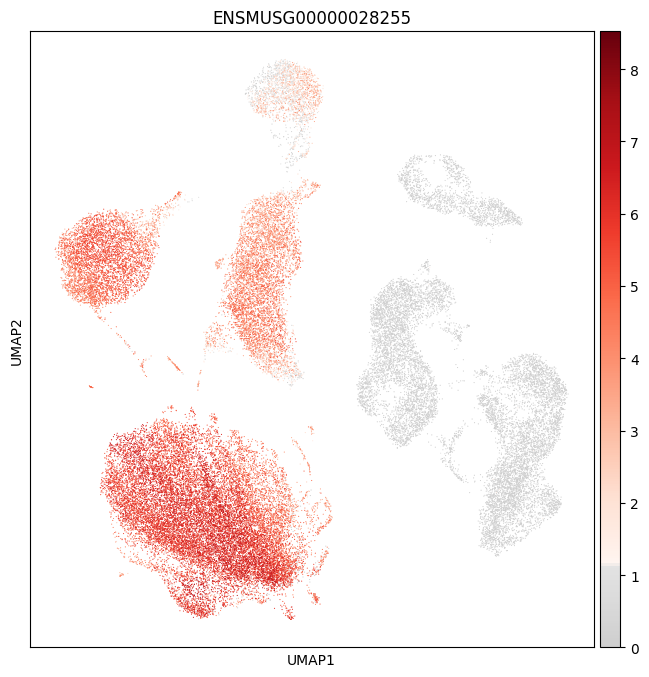

Encrypted symbol for  ENSMUSG00000035202 is  Lars2


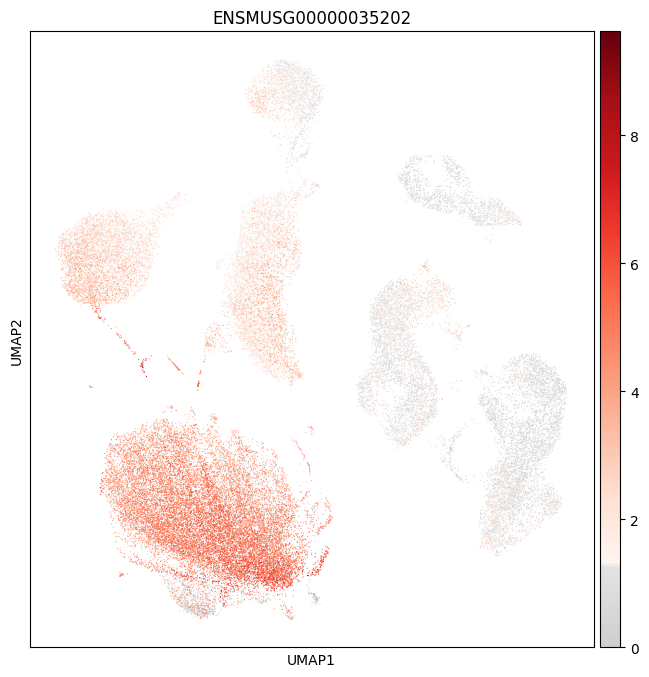

Encrypted symbol for  ENSMUSG00000074183 is  Gsta1


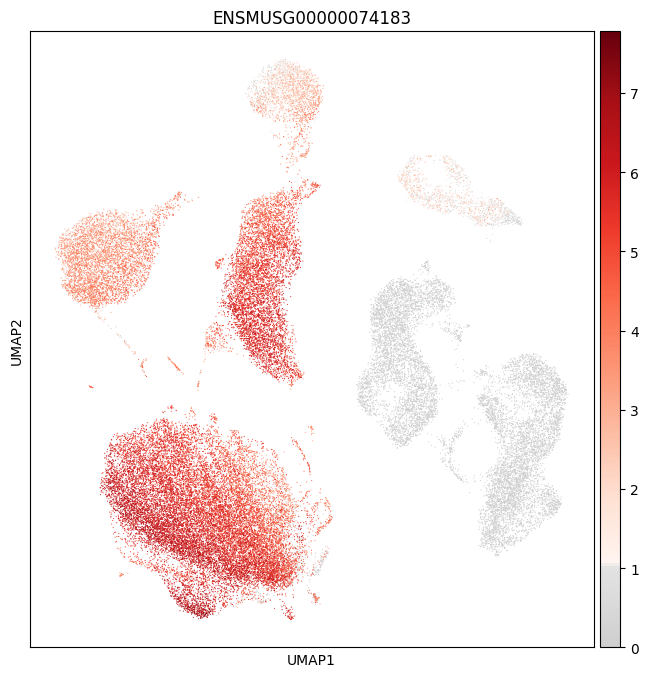

In [65]:
gene_symbols = ['ENSMUSG00000029635', 'ENSMUSG00000022748', 'ENSMUSG00000028255', 'ENSMUSG00000035202', 'ENSMUSG00000074183']

for gene_symbol in gene_symbols:
    encrypted_symbol = adata1.var[adata1.var.index == gene_symbol]['gene_symbols-0-0-0-0-0-0'].iloc[0]
    print('Encrypted symbol for ', gene_symbol, 'is ', encrypted_symbol)
    sc.pl.umap(adata, color=gene_symbol, use_raw=False, color_map=mymap, save='/combined_Cluster0_' + encrypted_symbol + '.pdf')


## Cluster 1

Encrypted symbol for  ENSMUSG00000029153 is  Ociad2


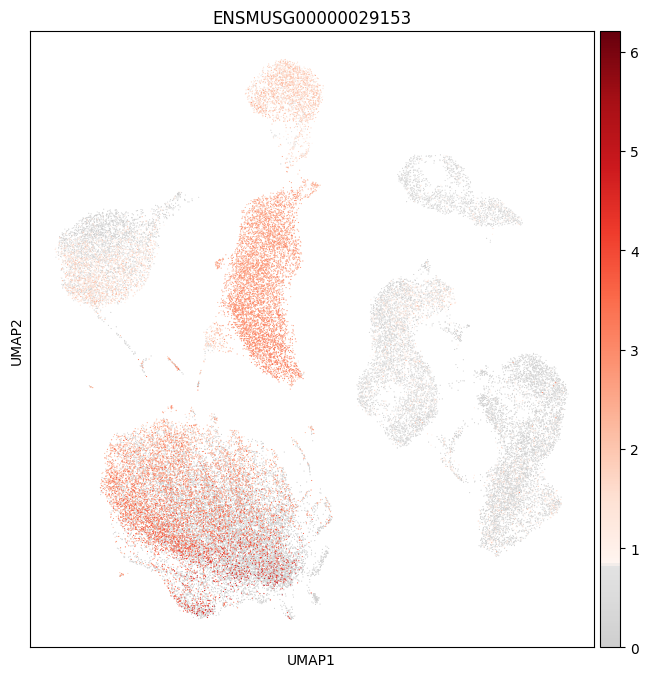

Encrypted symbol for  ENSMUSG00000030688 is  Stard10


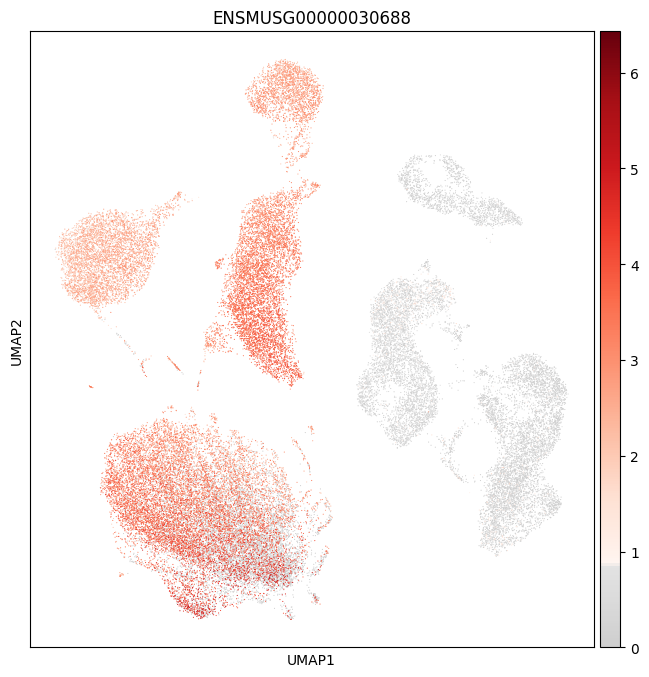

Encrypted symbol for  ENSMUSG00000032278 is  Paqr5


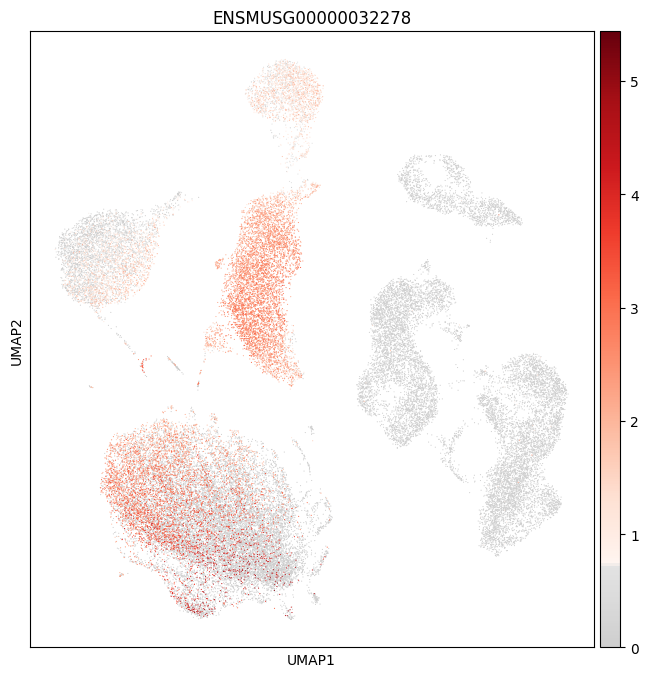

Encrypted symbol for  ENSMUSG00000017607 is  Tns4


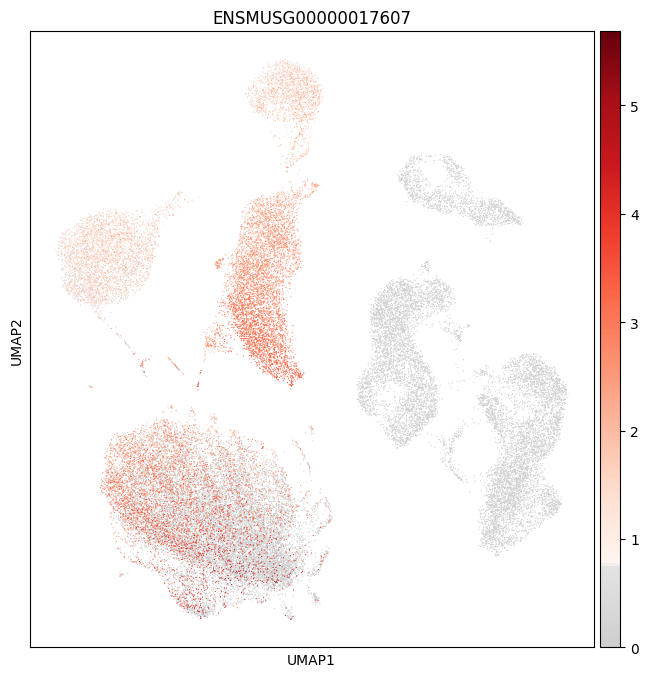

In [66]:
gene_symbols = ['ENSMUSG00000029153', 'ENSMUSG00000030688', 'ENSMUSG00000032278', 'ENSMUSG00000017607']

for gene_symbol in gene_symbols:
    encrypted_symbol = adata2.var[adata2.var.index == gene_symbol]['gene_symbols-0-0-0-0-0-0'].iloc[0]
    print('Encrypted symbol for ', gene_symbol, 'is ', encrypted_symbol)
    sc.pl.umap(adata, color=gene_symbol, use_raw=False, color_map=mymap, save='/combined_Cluster1_' + encrypted_symbol + '.pdf')


## Cluster 2

Encrypted symbol for  ENSMUSG00000001020 is  S100a4


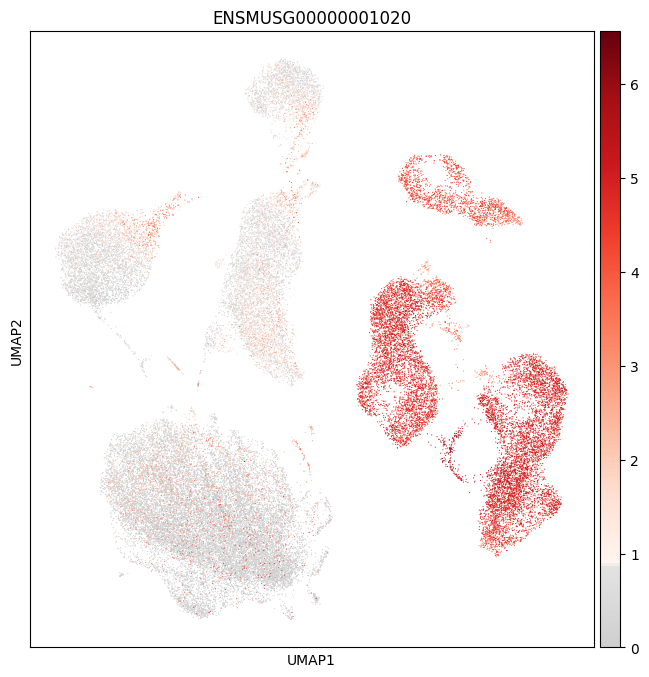

Encrypted symbol for  ENSMUSG00000064080 is  Fbln2


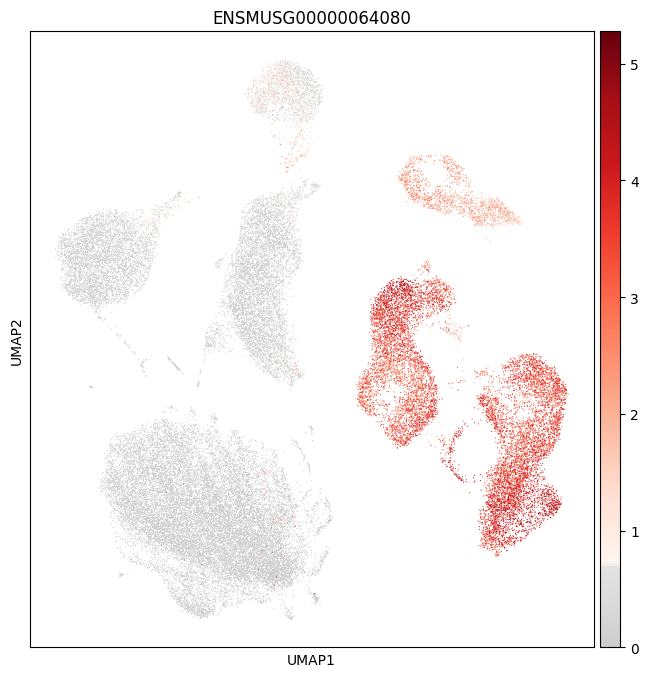

Encrypted symbol for  ENSMUSG00000029761 is  Cald1


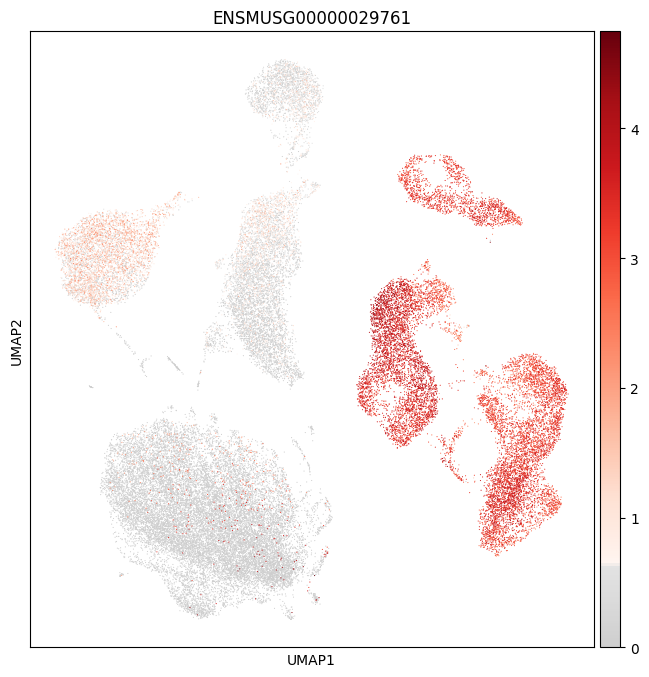

Encrypted symbol for  ENSMUSG00000026193 is  Fn1


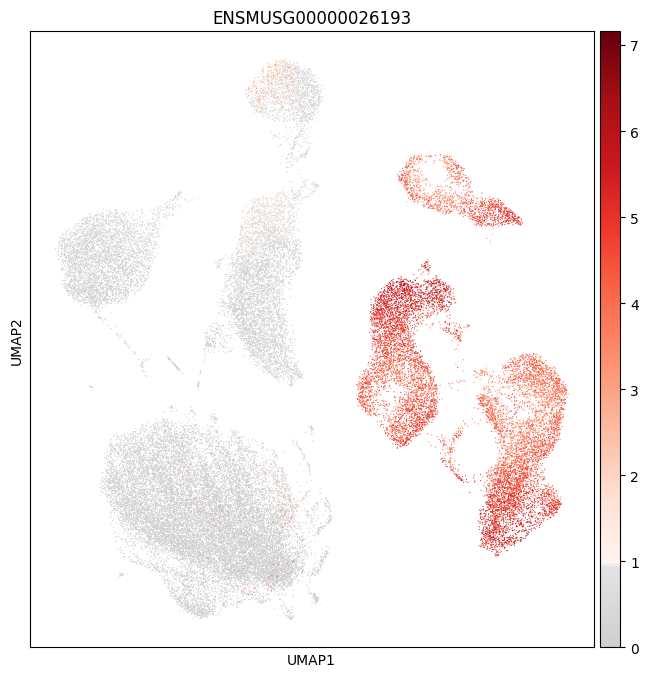

In [67]:
gene_symbols = ['ENSMUSG00000001020', 'ENSMUSG00000064080', 'ENSMUSG00000029761', 'ENSMUSG00000026193']

for gene_symbol in gene_symbols:
    encrypted_symbol = adata3.var[adata3.var.index == gene_symbol]['gene_symbols-0-0-0-0-0-0'].iloc[0]
    print('Encrypted symbol for ', gene_symbol, 'is ', encrypted_symbol)
    sc.pl.umap(adata, color=gene_symbol, use_raw=False, color_map=mymap, save='/combined_Cluster2_' + encrypted_symbol + '.pdf')

## Cluster 3

Encrypted symbol for  ENSMUSG00000026193 is  Fn1


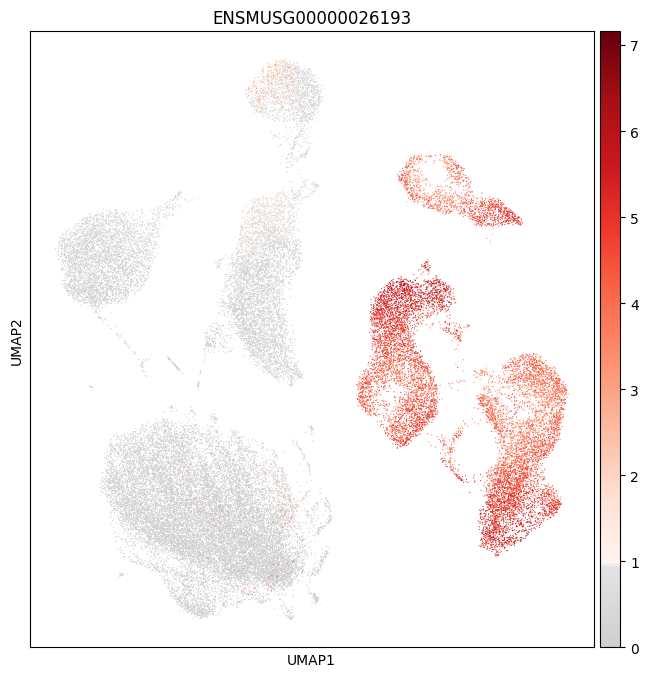

Encrypted symbol for  ENSMUSG00000068220 is  Lgals1


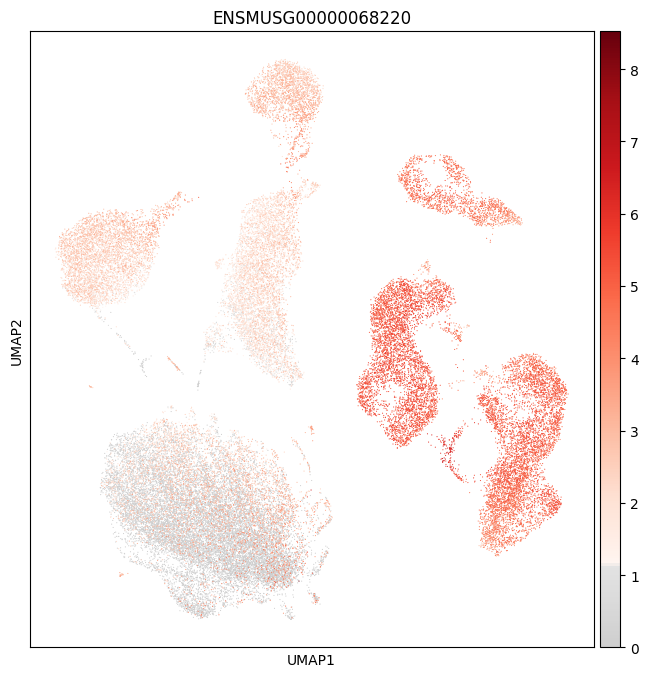

Encrypted symbol for  ENSMUSG00000001020 is  S100a4


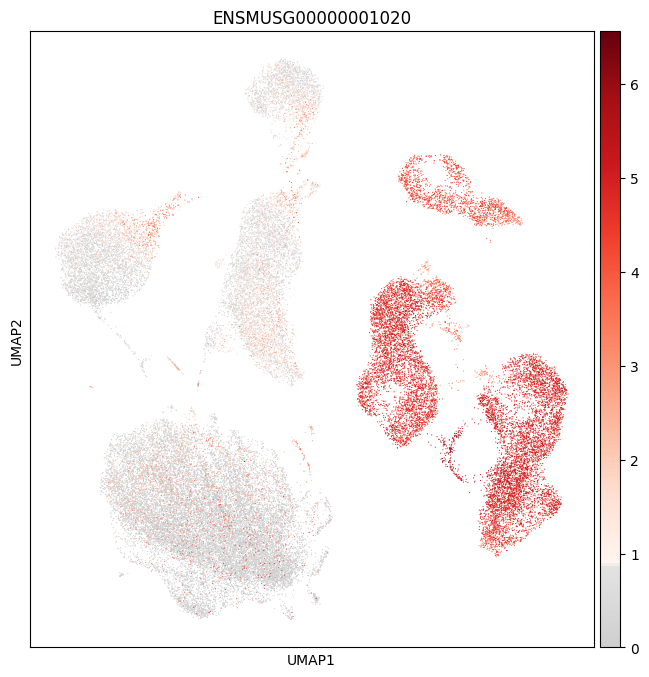

Encrypted symbol for  ENSMUSG00000029761 is  Cald1


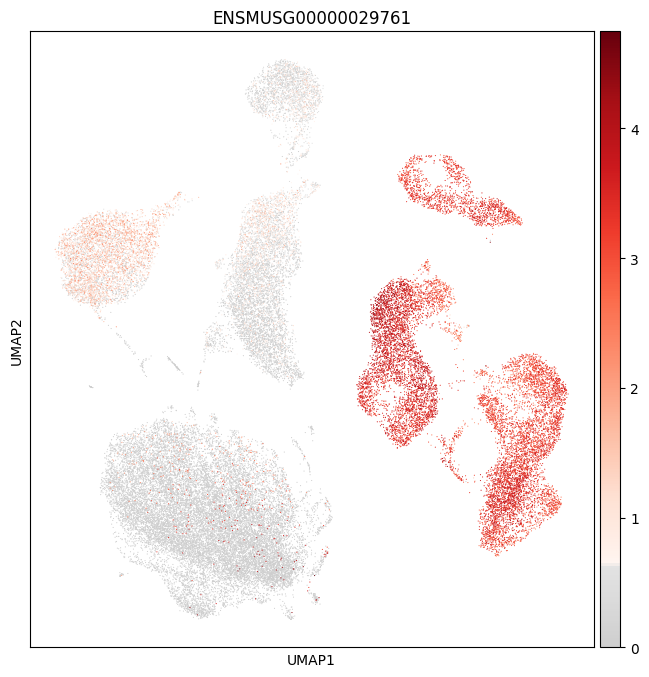

Encrypted symbol for  ENSMUSG00000022306 is  Zfpm2


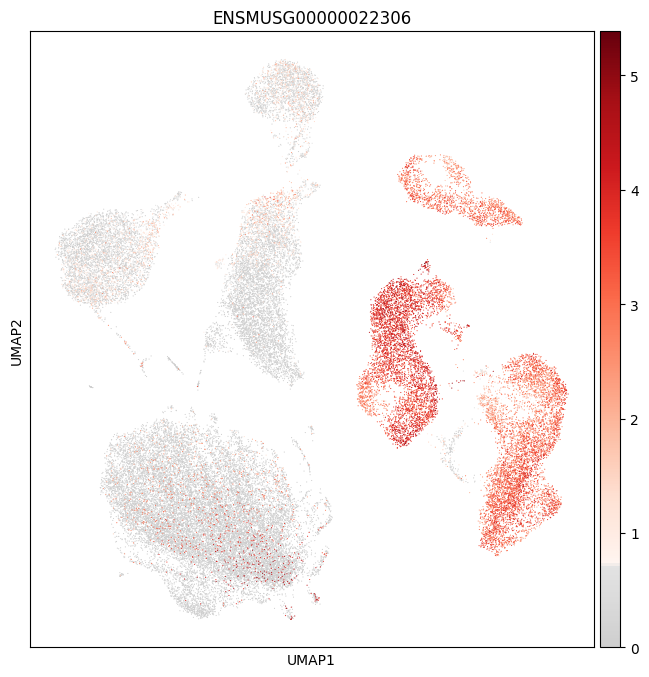

In [68]:
gene_symbols = ['ENSMUSG00000026193', 'ENSMUSG00000068220', 'ENSMUSG00000001020', 'ENSMUSG00000029761', 'ENSMUSG00000022306']

for gene_symbol in gene_symbols:
    encrypted_symbol = adata4.var[adata4.var.index == gene_symbol]['gene_symbols-0-0-0-0-0-0'].iloc[0]
    print('Encrypted symbol for ', gene_symbol, 'is ', encrypted_symbol)
    sc.pl.umap(adata, color=gene_symbol, use_raw=False, color_map=mymap, save='/combined_Cluster3_' + encrypted_symbol + '.pdf')


## Cluster 4

Encrypted symbol for  ENSMUSG00000041261 is  Car8


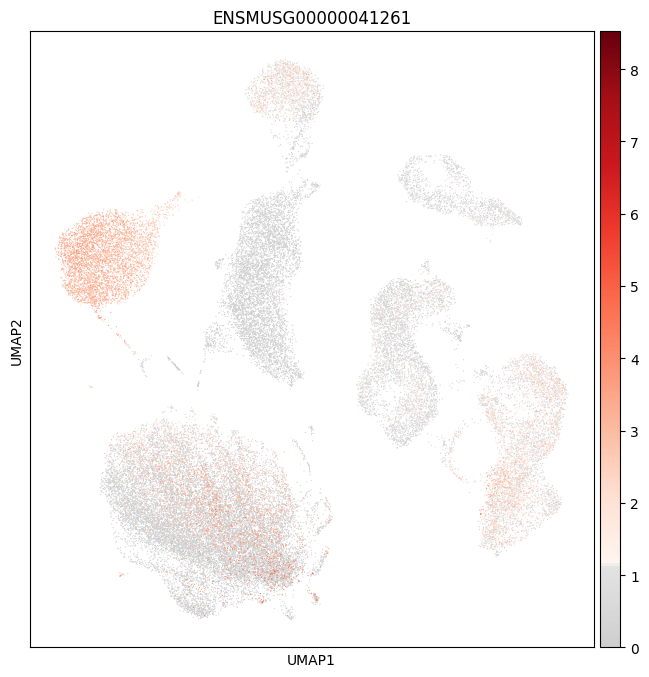

Encrypted symbol for  ENSMUSG00000027006 is  Dnajc10


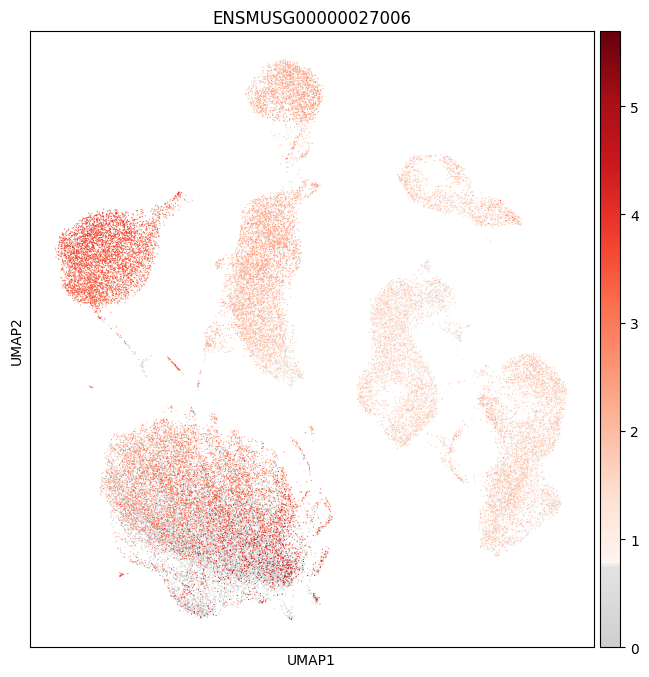

Encrypted symbol for  ENSMUSG00000055114 is  Anxa13


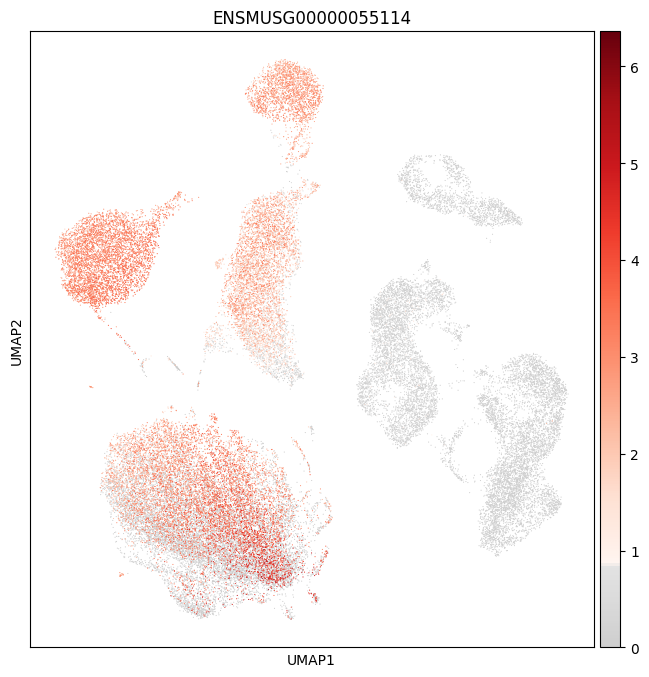

Encrypted symbol for  ENSMUSG00000058624 is  Gda


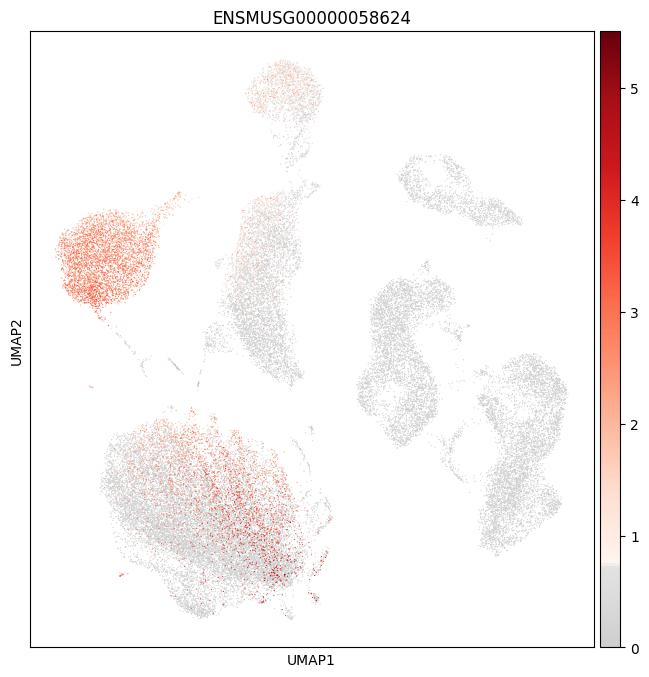

In [69]:
gene_symbols = ['ENSMUSG00000041261', 'ENSMUSG00000027006', 'ENSMUSG00000055114', 'ENSMUSG00000058624']

for gene_symbol in gene_symbols:
    encrypted_symbol = adata5.var[adata5.var.index == gene_symbol]['gene_symbols-0-0-0-0-0-0'].iloc[0]
    print('Encrypted symbol for ', gene_symbol, 'is ', encrypted_symbol)
    sc.pl.umap(adata, color=gene_symbol, use_raw=False, color_map=mymap, save='/combined_Cluster4_' + encrypted_symbol + '.pdf')

## Cluster 5

Encrypted symbol for  ENSMUSG00000074129 is  Rpl13a


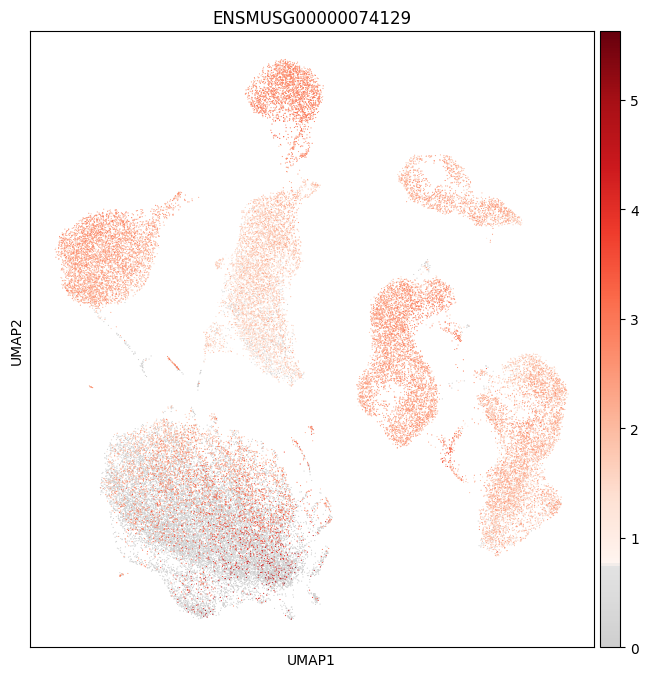

Encrypted symbol for  ENSMUSG00000052942 is  Glis3


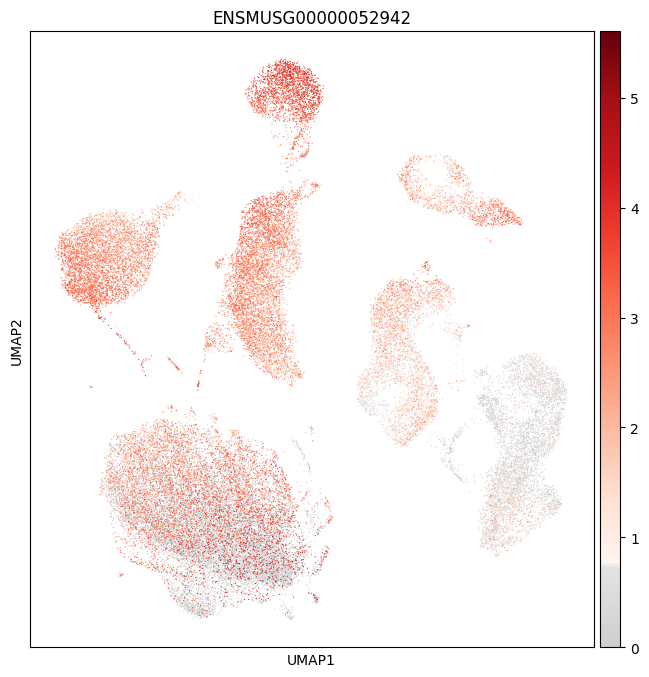

Encrypted symbol for  ENSMUSG00000045991 is  Onecut2


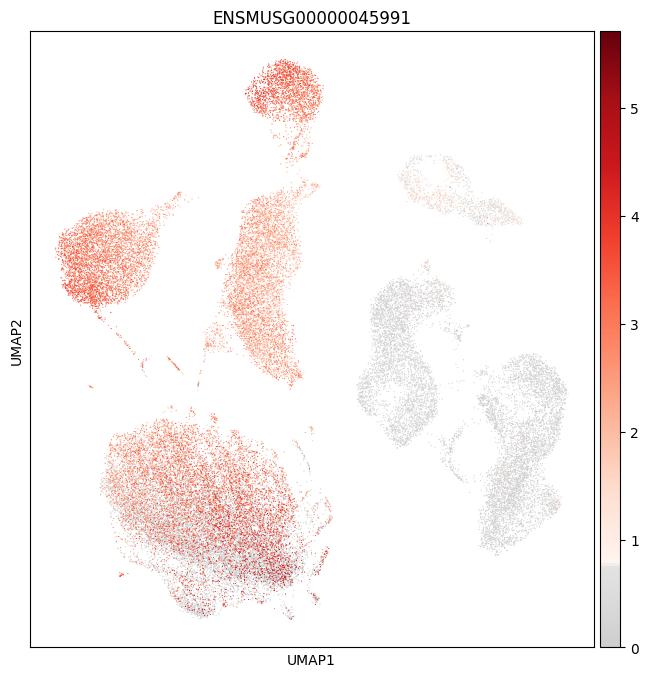

Encrypted symbol for  ENSMUSG00000008682 is  Rpl10


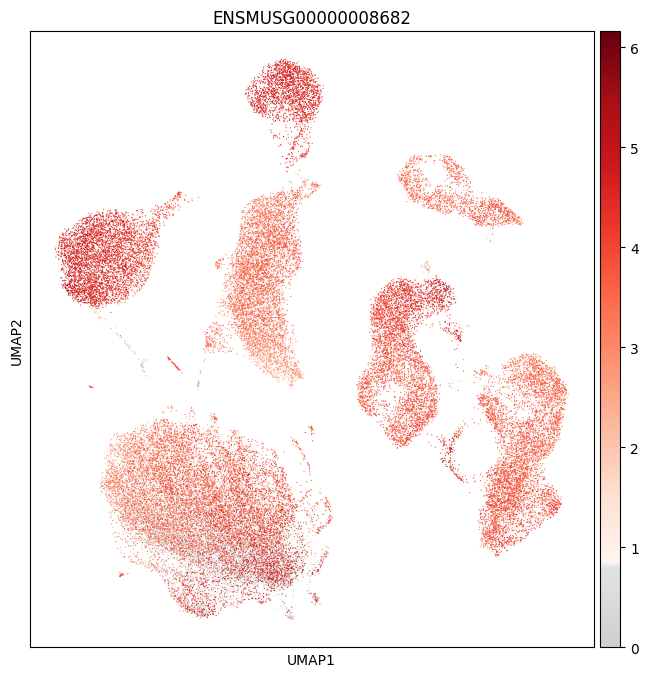

Encrypted symbol for  ENSMUSG00000058558 is  Rpl5


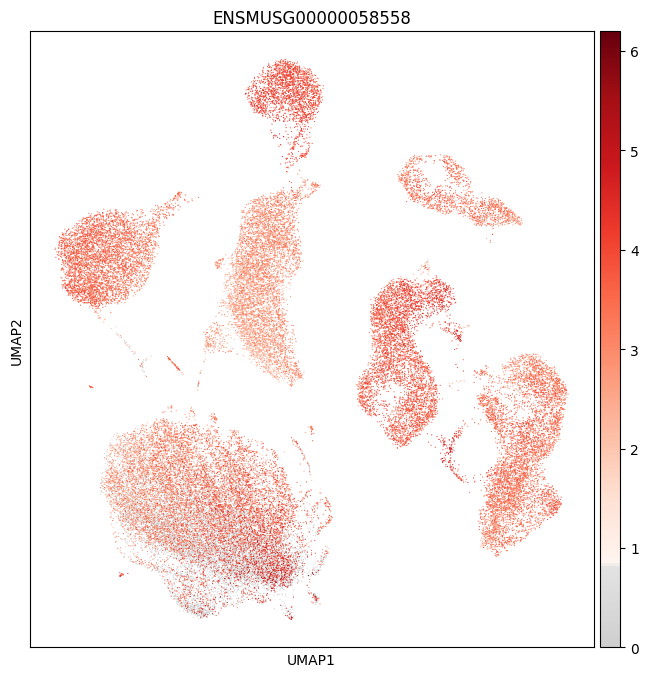

In [70]:
gene_symbols = ['ENSMUSG00000074129', 'ENSMUSG00000052942', 'ENSMUSG00000045991', 'ENSMUSG00000008682', 'ENSMUSG00000058558']

for gene_symbol in gene_symbols:
    encrypted_symbol = adata6.var[adata6.var.index == gene_symbol]['gene_symbols-0-0-0-0-0-0'].iloc[0]
    print('Encrypted symbol for ', gene_symbol, 'is ', encrypted_symbol)
    sc.pl.umap(adata, color=gene_symbol, use_raw=False, color_map=mymap, save='/combined_Cluster5_' + encrypted_symbol + '.pdf')

## Cluster 6

Encrypted symbol for  ENSMUSG00000029761 is  Cald1


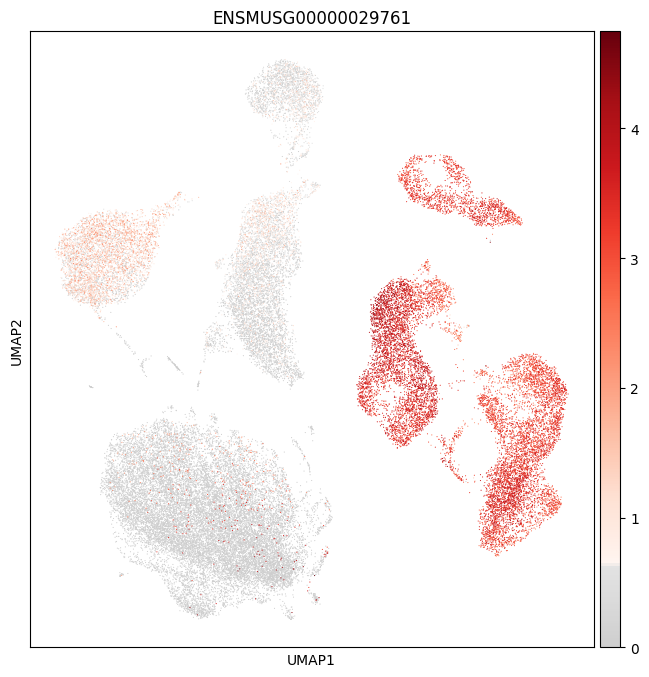

Encrypted symbol for  ENSMUSG00000040466 is  Blvrb


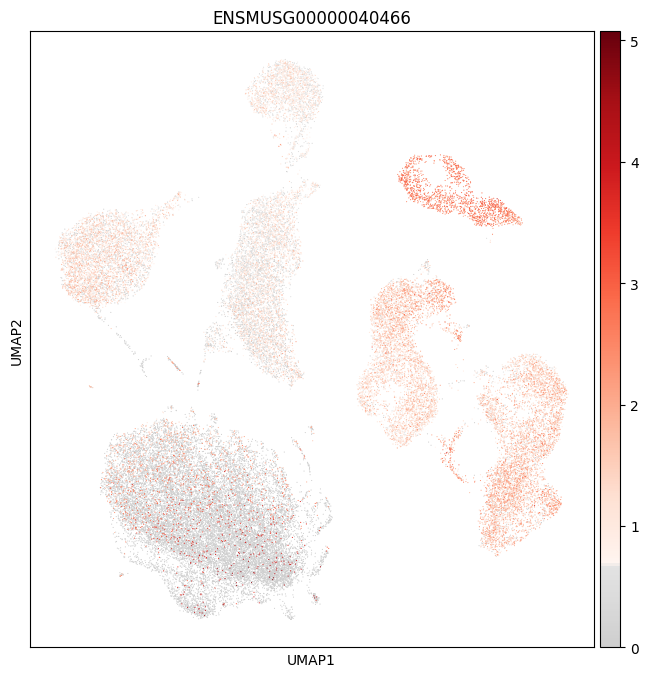

Encrypted symbol for  ENSMUSG00000005397 is  Nid1


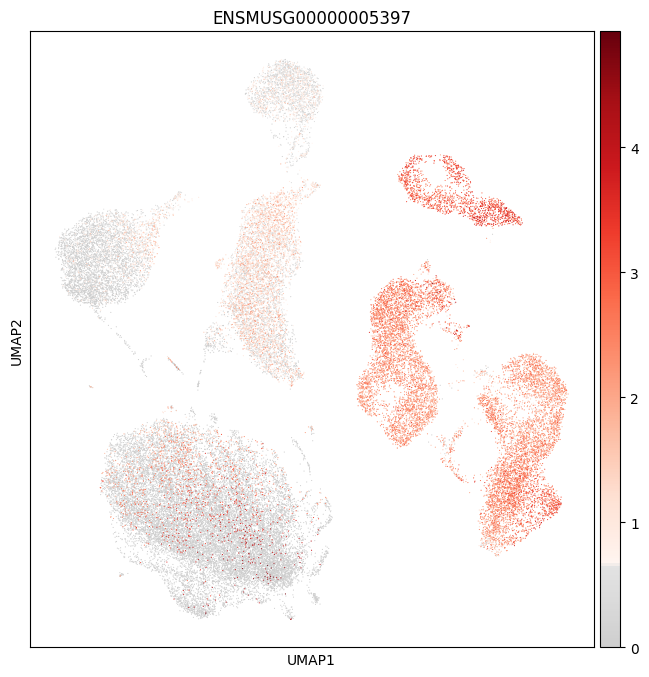

Encrypted symbol for  ENSMUSG00000021477 is  Ctsl


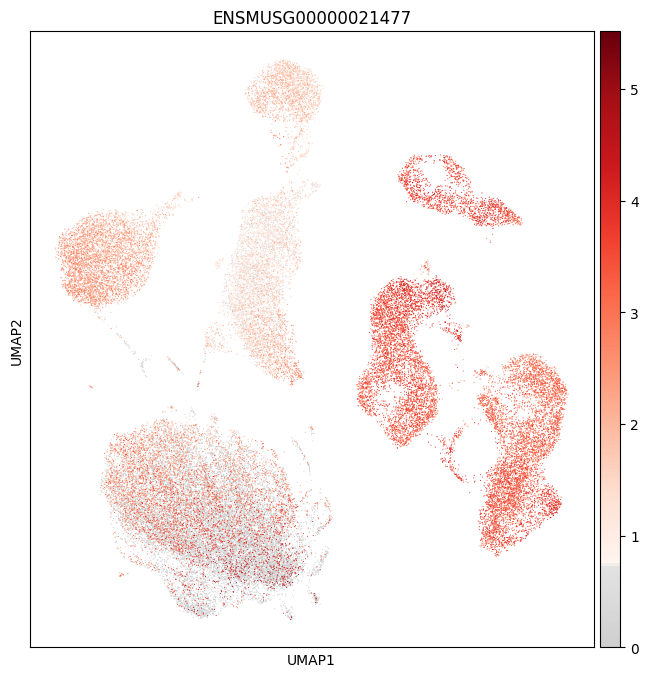

Encrypted symbol for  ENSMUSG00000001020 is  S100a4


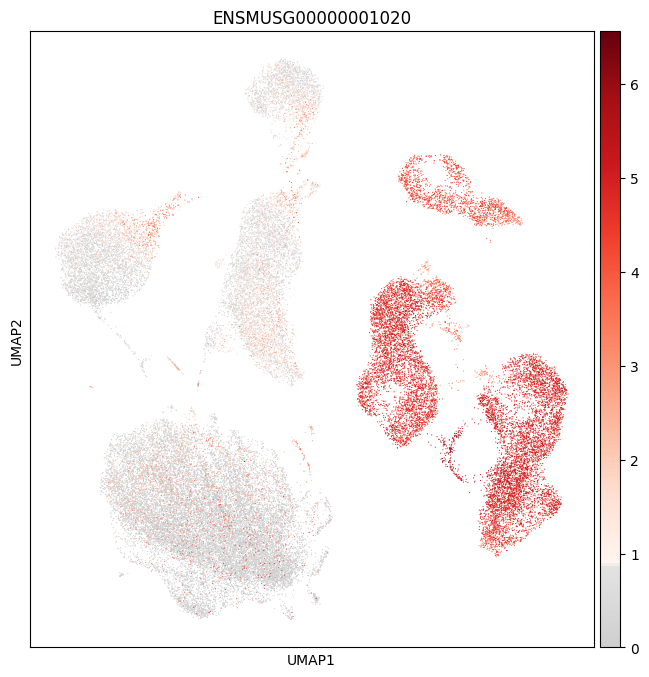

Encrypted symbol for  ENSMUSG00000026728 is  Vim


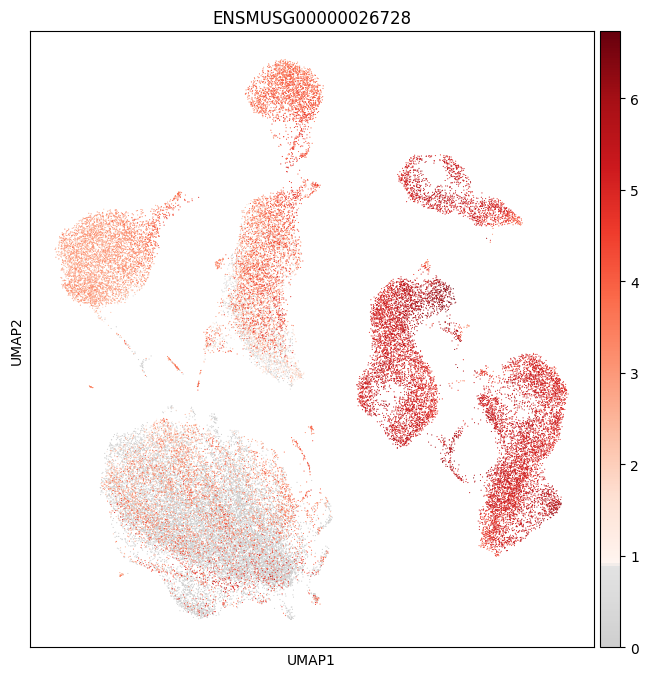

In [71]:
gene_symbols = ['ENSMUSG00000029761', 'ENSMUSG00000040466', 'ENSMUSG00000005397', 'ENSMUSG00000021477', 'ENSMUSG00000001020', 'ENSMUSG00000026728']

for gene_symbol in gene_symbols:
    encrypted_symbol = adata7.var[adata7.var.index == gene_symbol]['gene_symbols-0-0-0-0-0-0'].iloc[0]
    print('Encrypted symbol for ', gene_symbol, 'is ', encrypted_symbol)
    sc.pl.umap(adata, color=gene_symbol, use_raw=False, color_map=mymap, save='/combined_Cluster6_' + encrypted_symbol + '.pdf')
